In [28]:
import os
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

# CLAHE

## test

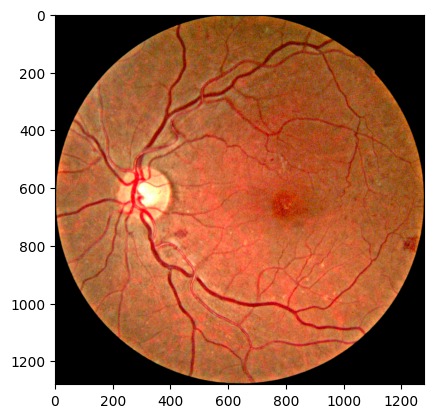

In [22]:
img_he = cv2.imread('../../drive/MyDrive/Projects/dr_segmentation_python/FGADR-Seg-set_Release/Seg-set/Original_Images/0000_1.png')
img_he = cv2.cvtColor(img_he, cv2.COLOR_BGR2RGB)
plt.imshow(img_he)

In [17]:
img_he.shape

(1280, 1280, 3)

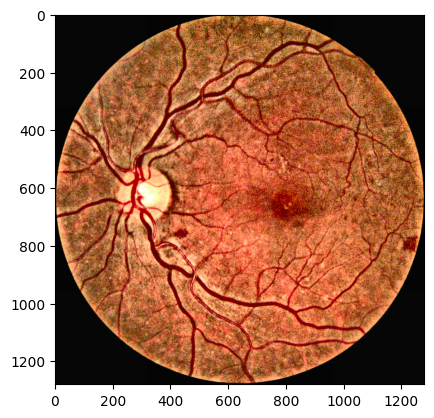

In [23]:
img_he = cv2.cvtColor(img_he, cv2.COLOR_RGB2LAB)

img_he_clahe = img_he.copy()
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
img_he_clahe[:, :, 0] = clahe.apply(img_he_clahe[:, :, 0])
img_he_clahe = cv2.cvtColor(img_he_clahe, cv2.COLOR_LAB2RGB)
plt.imshow(img_he_clahe)

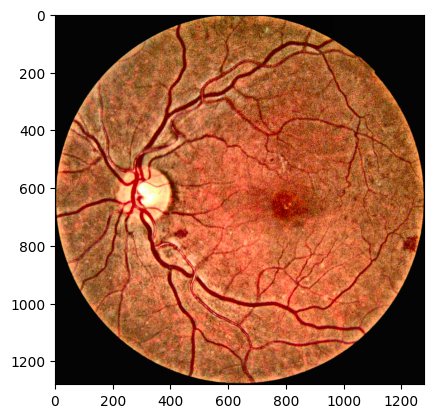

In [24]:
img_he_clahe = img_he.copy()
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_he_clahe[:, :, 0] = clahe.apply(img_he_clahe[:, :, 0])
img_he_clahe = cv2.cvtColor(img_he_clahe, cv2.COLOR_LAB2RGB)
plt.imshow(img_he_clahe)

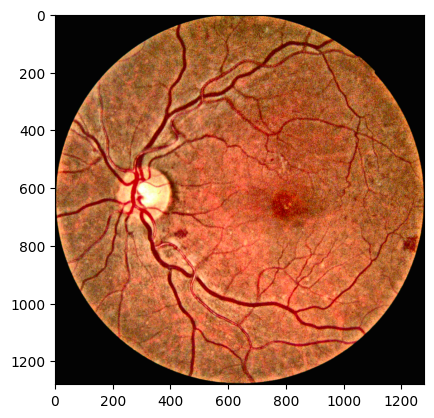

In [25]:
img_he_clahe = img_he.copy()
clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8, 8))
img_he_clahe[:, :, 0] = clahe.apply(img_he_clahe[:, :, 0])
img_he_clahe = cv2.cvtColor(img_he_clahe, cv2.COLOR_LAB2RGB)
plt.imshow(img_he_clahe)

## random test

In [29]:
# 폴더에서 사진 무작위로 추출하기
path = '../../drive/MyDrive/Projects/dr_segmentation_python/FGADR-Seg-set_Release/Seg-set/Original_Images/'
file_list = os.listdir(path)
len(file_list)

845

In [31]:
random_list = random.sample(file_list, 25)
len(random_list)

25

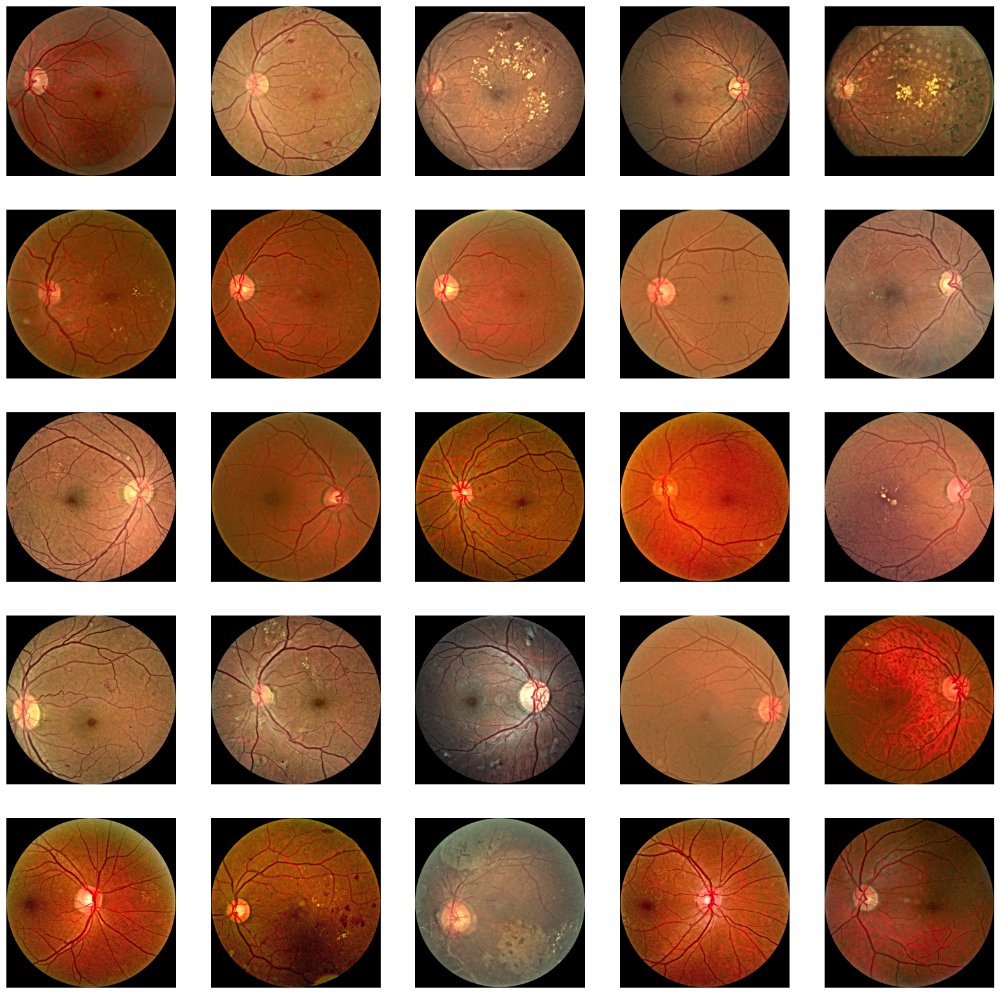

In [34]:
plt.figure(figsize=(20, 20))
for i in range(25):
    img = cv2.imread(path + random_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.subplot(5, 5, i+1)
    plt.imshow(img)
    plt.axis('off')

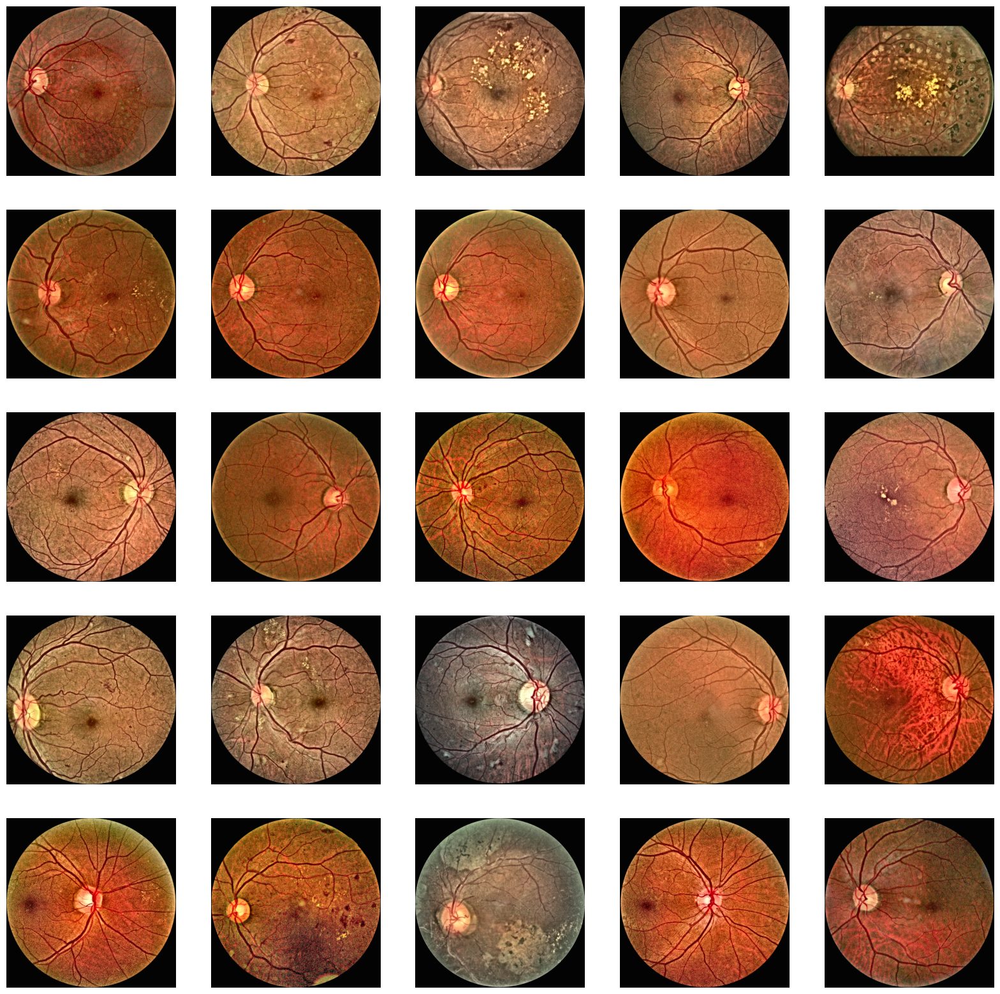

In [32]:
# clahe 적용하여 이미지 여러 개 보기
plt.figure(figsize=(20, 20))
for i in range(25):
    img = cv2.imread(path + random_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_clahe = img.copy()
    clahe = cv2.createCLAHE(clipLimit=1.5, tileGridSize=(8, 8))
    img_clahe[:, :, 0] = clahe.apply(img_clahe[:, :, 0])
    img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_LAB2RGB)
    plt.subplot(5, 5, i+1)
    plt.imshow(img_clahe)
    plt.axis('off')

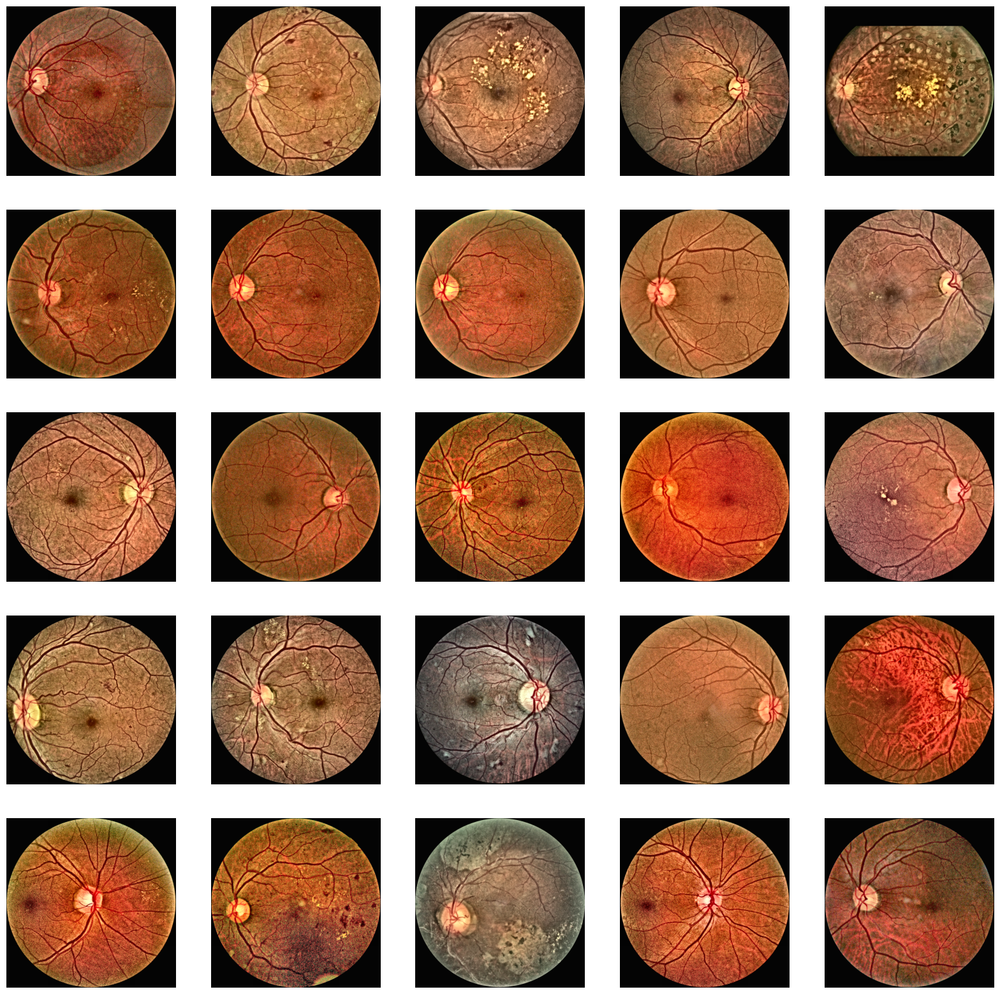

In [33]:
# clahe 적용하여 이미지 여러 개 보기
plt.figure(figsize=(20, 20))
for i in range(25):
    img = cv2.imread(path + random_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_clahe = img.copy()
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_clahe[:, :, 0] = clahe.apply(img_clahe[:, :, 0])
    img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_LAB2RGB)
    plt.subplot(5, 5, i+1)
    plt.imshow(img_clahe)
    plt.axis('off')

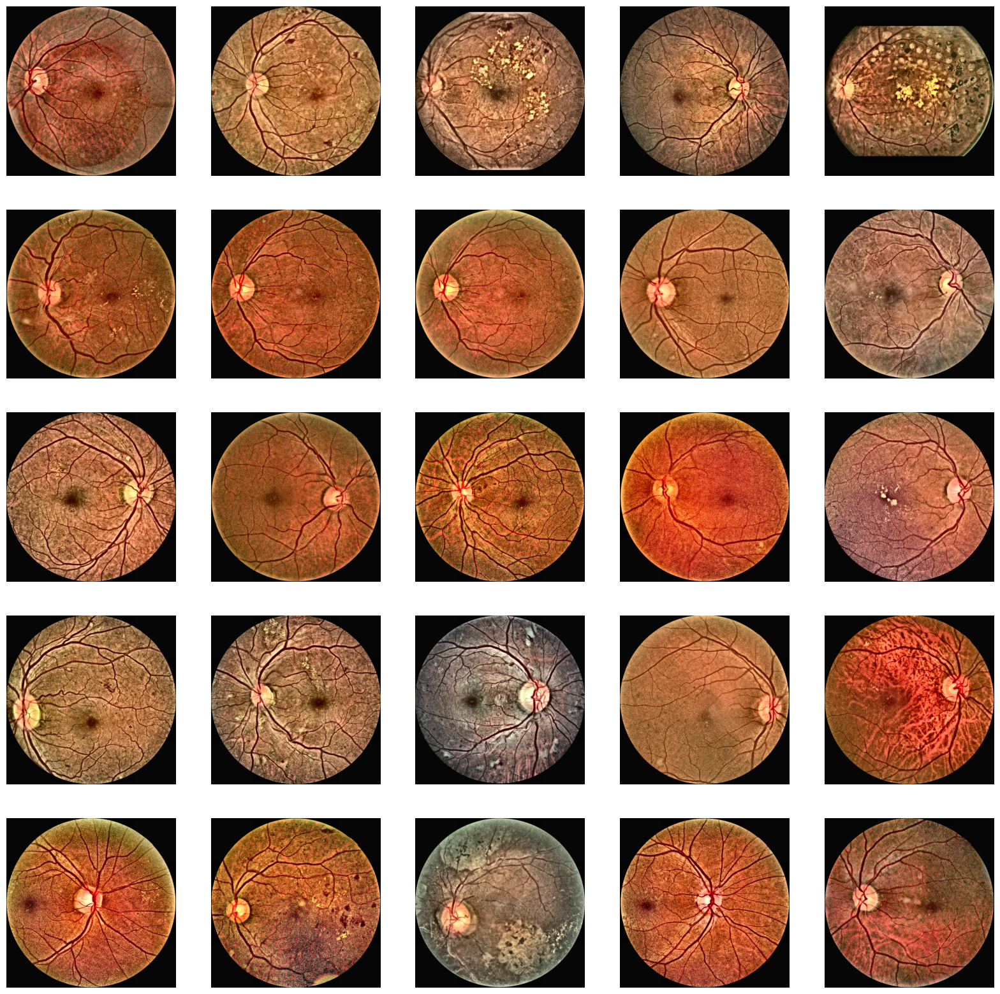

In [35]:
# clahe 적용하여 이미지 여러 개 보기
plt.figure(figsize=(20, 20))
for i in range(25):
    img = cv2.imread(path + random_list[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    img_clahe = img.copy()
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    img_clahe[:, :, 0] = clahe.apply(img_clahe[:, :, 0])
    img_clahe = cv2.cvtColor(img_clahe, cv2.COLOR_LAB2RGB)
    plt.subplot(5, 5, i+1)
    plt.imshow(img_clahe)
    plt.axis('off')

# resize

In [36]:
img_he = cv2.imread('../../drive/MyDrive/Projects/dr_segmentation_python/FGADR-Seg-set_Release/Seg-set/Original_Images/0000_1.png')
img_he = cv2.cvtColor(img_he, cv2.COLOR_BGR2RGB)

img_he = cv2.cvtColor(img_he, cv2.COLOR_RGB2LAB)

img_he_clahe = img_he.copy()
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_he_clahe[:, :, 0] = clahe.apply(img_he_clahe[:, :, 0])
img_he_clahe = cv2.cvtColor(img_he_clahe, cv2.COLOR_LAB2RGB)

img_he_resize = cv2.resize(img_he_clahe, (512, 512))
img_he_resize.shape

(512, 512, 3)

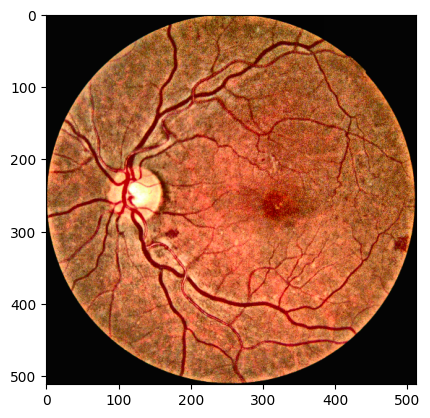

In [37]:
plt.imshow(img_he_resize)

# data loader

In [38]:
import torch
from torch.utils.data import Dataset
from torchvision import datasets
from torchvision.transforms import ToTensor
from torchvision.io import read_image

In [ ]:
'''
class CustomImageDataset(Dataset):
    def __init__(self, img_dir, annotations_dir, transform=None, target_transform=None):
        self.img_dir = img_dir
        self.annotations_dir = annotations_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(os.listdir(self.annotations_dir))

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.annotation_dir)
        image = read_image(img_path)
        mask = self.annotation_dir
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            mask = self.target_transform(mask)
        return image, mask
'''